In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (63).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (73).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (83).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (61).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (55).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (94).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (113).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (67).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (53).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (34).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (4).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/Snow-Covered/Snow (45).jpg
/kaggle/input/solar-panel-images/Faulty_solar_panel/

 PHASE 1 - DATA PREPARATION

In [2]:


# This script covers all steps required to prepare the solar panel image dataset for model training.
# - Step 1: Verifies the initial dataset structure and image counts for JPG, JPEG, and PNG files.
# - Step 2: Implements a preprocessing pipeline (Resize, CLAHE, Denoise).
# - Step 3: Quantifies preprocessing impact using PSNR and SSIM metrics.
# - Step 4: Splits the data into training, validation, and testing sets (80/10/10).
# - Step 5: Applies data augmentation to the training set to create a balanced
#           dataset with 1000 images per class.
# - Step 6: Includes comprehensive visualizations for each major step.


## 1. IMPORTS

In [3]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import shutil
from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import warnings

# Suppress minor warnings
warnings.filterwarnings("ignore")
print("Libraries imported successfully.")

Libraries imported successfully.


## 2. DATASET VERIFICATION AND VISUALIZATION

In [4]:

try:
    dataset_path = '/kaggle/input/solar-panel-images/Faulty_solar_panel'
    if not os.path.exists(dataset_path):
         raise FileNotFoundError
except FileNotFoundError:
    print("Kaggle dataset path not found. Please ensure your dataset is in the correct directory.")
    # As a fallback for local execution, you might set it like this:
    # dataset_path = './Faulty_solar_panel'
    # For now, creating a dummy structure to allow the script to run.
    if not os.path.exists('./Faulty_solar_panel'):
        os.makedirs('./Faulty_solar_panel', exist_ok=True)
        dummy_classes = ['Clean', 'Dusty', 'Bird-drop', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']
        for cls in dummy_classes:
            os.makedirs(os.path.join('./Faulty_solar_panel', cls), exist_ok=True)
        print("Created dummy dataset directories for script execution.")
    dataset_path = './Faulty_solar_panel'


print(f"Dataset path set to: {dataset_path}")


Dataset path set to: /kaggle/input/solar-panel-images/Faulty_solar_panel


### --- Get all image files (jpg, jpeg, png) ---

In [5]:

def get_image_files(path):
    return glob.glob(os.path.join(path, "*.jpg")) + \
           glob.glob(os.path.join(path, "*.jpeg")) + \
           glob.glob(os.path.join(path, "*.png"))

### --- Count images in each class ---

In [6]:

print("\nVerifying initial image counts per class:")
classes = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])
for cls in classes:
    class_path = os.path.join(dataset_path, cls)
    image_files = get_image_files(class_path)
    print(f"- {cls}: {len(image_files)} images")


Verifying initial image counts per class:
- Bird-drop: 171 images
- Clean: 185 images
- Dusty: 190 images
- Electrical-damage: 90 images
- Physical-Damage: 66 images
- Snow-Covered: 105 images


### --- Visualize a few sample images ---


Visualizing random samples from each class...


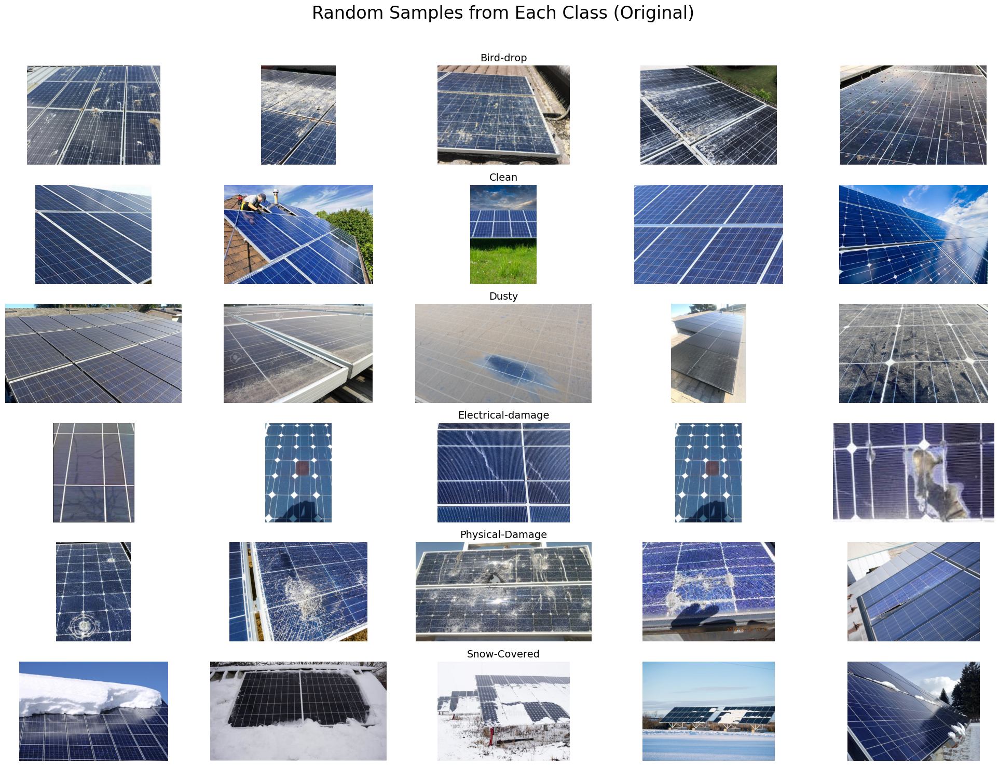

In [7]:

print("\nVisualizing random samples from each class...")
fig, axes = plt.subplots(len(classes), 5, figsize=(20, 15))
fig.suptitle('Random Samples from Each Class (Original)', fontsize=24)

for i, cls in enumerate(classes):
    class_path = os.path.join(dataset_path, cls)
    image_files = get_image_files(class_path)
    if image_files:
        sample_files = random.sample(image_files, min(5, len(image_files)))
        for j, img_path in enumerate(sample_files):
            try:
                img = plt.imread(img_path)
                axes[i, j].imshow(img)
                axes[i, j].axis("off")
                if j == 2: # Center column for title
                    axes[i, j].set_title(cls, fontsize=14)
            except Exception as e:
                axes[i, j].text(0.5, 0.5, 'Error', ha='center')
                axes[i, j].axis("off")
                print(f"Could not read {img_path}: {e}")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


## 3. IMAGE PREPROCESSING PIPELINE

In [8]:

print("\nStarting image preprocessing pipeline...")
output_dir = "/kaggle/working/preprocessed_dataset"
os.makedirs(output_dir, exist_ok=True)

IMG_SIZE = (224, 224)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
preprocessing_examples = {}

for cls in tqdm(classes, desc="Preprocessing classes"):
    class_input_path = os.path.join(dataset_path, cls)
    class_output_path = os.path.join(output_dir, cls)
    os.makedirs(class_output_path, exist_ok=True)

    image_files = get_image_files(class_input_path)
    if image_files:
        preprocessing_examples[cls] = image_files[0]

    for img_path in image_files:
        try:
            img = cv2.imread(img_path)
            if img is None: continue

            # Pipeline steps
            img_resized = cv2.resize(img, IMG_SIZE)
            yuv = cv2.cvtColor(img_resized, cv2.COLOR_BGR2YUV)
            yuv[:, :, 0] = clahe.apply(yuv[:, :, 0])
            img_clahe = cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)
            img_denoised = cv2.fastNlMeansDenoisingColored(img_clahe, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21)
            
            # Save preprocessed image as JPG for consistency
            file_name = os.path.splitext(os.path.basename(img_path))[0] + '.jpg'
            cv2.imwrite(os.path.join(class_output_path, file_name), img_denoised)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

print(f"\nAll images preprocessed and saved in: {output_dir}")


Starting image preprocessing pipeline...


Preprocessing classes: 100%|██████████| 6/6 [02:26<00:00, 24.37s/it]


All images preprocessed and saved in: /kaggle/working/preprocessed_dataset


## 3.1. PREPROCESSING VISUALIZATION AND METRICS


Calculating PSNR/SSIM and visualizing preprocessing steps...
- Bird-drop: PSNR = 21.61, SSIM = 0.8337
- Clean: PSNR = 20.92, SSIM = 0.8370
- Dusty: PSNR = 19.63, SSIM = 0.8479
- Electrical-damage: PSNR = 25.24, SSIM = 0.8769
- Physical-Damage: PSNR = 20.62, SSIM = 0.8668
- Snow-Covered: PSNR = 22.17, SSIM = 0.8539


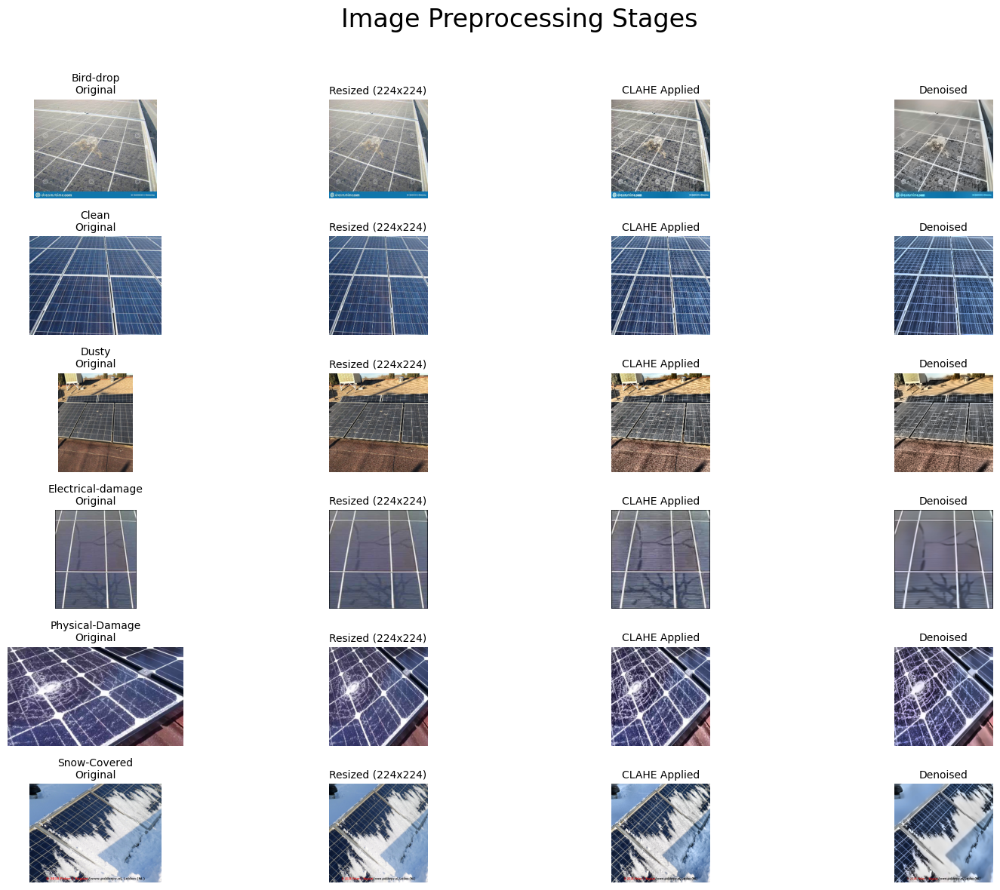

In [9]:

print("\nCalculating PSNR/SSIM and visualizing preprocessing steps...")
fig, axes = plt.subplots(len(classes), 4, figsize=(16, 12))
fig.suptitle('Image Preprocessing Stages', fontsize=24)

for i, cls in enumerate(classes):
    img_path = preprocessing_examples.get(cls)
    if not img_path: continue
    
    original_img = cv2.imread(img_path)
    
    # --- Apply steps for visualization ---
    img_resized = cv2.resize(original_img, IMG_SIZE)
    yuv = cv2.cvtColor(img_resized, cv2.COLOR_BGR2YUV)
    yuv[:, :, 0] = clahe.apply(yuv[:, :, 0])
    img_clahe = cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)
    img_denoised = cv2.fastNlMeansDenoisingColored(img_clahe, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21)

    # Calculate metrics against the resized image
    psnr_val = psnr(img_resized, img_denoised, data_range=255)
    ssim_val = ssim(img_resized, img_denoised, channel_axis=-1, data_range=255, win_size=7)
    print(f"- {cls}: PSNR = {psnr_val:.2f}, SSIM = {ssim_val:.4f}")
    
    # --- Plotting ---
    axes[i, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f"{cls}\nOriginal", fontsize=10)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title("Resized (224x224)", fontsize=10)
    axes[i, 1].axis('off')

    axes[i, 2].imshow(cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title("CLAHE Applied", fontsize=10)
    axes[i, 2].axis('off')

    axes[i, 3].imshow(cv2.cvtColor(img_denoised, cv2.COLOR_BGR2RGB))
    axes[i, 3].set_title("Denoised", fontsize=10)
    axes[i, 3].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## 4. DATA SPLITTING (80-10-10)

In [10]:

print("\nSplitting dataset into train, validation, and test sets...")
split_base_dir = "/kaggle/working/solar_panel_split"
train_dir = os.path.join(split_base_dir, "train")
val_dir = os.path.join(split_base_dir, "val")
test_dir = os.path.join(split_base_dir, "test")

if os.path.exists(split_base_dir): shutil.rmtree(split_base_dir)

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for cls in classes:
    print(f"Splitting class: {cls}")
    class_path = os.path.join(output_dir, cls)
    
    os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(val_dir, cls), exist_ok=True)
    os.makedirs(os.path.join(test_dir, cls), exist_ok=True)

    all_files = get_image_files(class_path)
    random.shuffle(all_files)

    n_total = len(all_files)
    n_train = int(n_total * 0.8)
    n_val = int(n_total * 0.1)

    train_files = all_files[:n_train]
    val_files = all_files[n_train : n_train + n_val]
    test_files = all_files[n_train + n_val:]

    for f in train_files: shutil.copy(f, os.path.join(train_dir, cls))
    for f in val_files: shutil.copy(f, os.path.join(val_dir, cls))
    for f in test_files: shutil.copy(f, os.path.join(test_dir, cls))

print(f"\nDataset split and saved in: {split_base_dir}")



Splitting dataset into train, validation, and test sets...
Splitting class: Bird-drop
Splitting class: Clean
Splitting class: Dusty
Splitting class: Electrical-damage
Splitting class: Physical-Damage
Splitting class: Snow-Covered

Dataset split and saved in: /kaggle/working/solar_panel_split


### --- Verify split counts ---

In [11]:

print("\nVerifying image counts after splitting:")
for split in ["train", "val", "test"]:
    print(f"\n--- {split.capitalize()} Split ---")
    split_path = os.path.join(split_base_dir, split)
    total_images = 0
    for cls in sorted(os.listdir(split_path)):
        num_images = len(get_image_files(os.path.join(split_path, cls)))
        print(f"- {cls}: {num_images} images")
        total_images += num_images
    print(f"Total in {split}: {total_images} images")



Verifying image counts after splitting:

--- Train Split ---
- Bird-drop: 136 images
- Clean: 148 images
- Dusty: 152 images
- Electrical-damage: 71 images
- Physical-Damage: 52 images
- Snow-Covered: 84 images
Total in train: 643 images

--- Val Split ---
- Bird-drop: 17 images
- Clean: 18 images
- Dusty: 19 images
- Electrical-damage: 8 images
- Physical-Damage: 6 images
- Snow-Covered: 10 images
Total in val: 78 images

--- Test Split ---
- Bird-drop: 17 images
- Clean: 19 images
- Dusty: 19 images
- Electrical-damage: 10 images
- Physical-Damage: 8 images
- Snow-Covered: 11 images
Total in test: 84 images


## 5. DATA AUGMENTATION

In [12]:

print("\nApplying data augmentation to the training set...")
aug_train_dir = "/kaggle/working/train_augmented"
TARGET_COUNT_PER_CLASS = 1000

if os.path.exists(aug_train_dir): shutil.rmtree(aug_train_dir)
os.makedirs(aug_train_dir, exist_ok=True)

def random_flip(img): return cv2.flip(img, random.choice([-1, 0, 1]))
def random_rotate(img):
    angle = random.uniform(-20, 20); h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    return cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REFLECT)
def random_zoom(img):
    zoom = random.uniform(0.8, 1.2); h, w = img.shape[:2]
    nh, nw = int(h*zoom), int(w*zoom)
    img_r = cv2.resize(img, (nw, nh))
    if zoom < 1:
        ph, pw = (h-nh)//2, (w-nw)//2
        return cv2.copyMakeBorder(img_r, ph, h-nh-ph, pw, w-nw-pw, cv2.BORDER_REFLECT)
    else:
        sh, sw = (nh-h)//2, (nw-w)//2
        return img_r[sh:sh+h, sw:sw+w]
def random_brightness(img): return cv2.convertScaleAbs(img, alpha=random.uniform(0.7, 1.3), beta=0)

augmentations = [random_flip, random_rotate, random_zoom, random_brightness]

for cls in tqdm(classes, desc="Augmenting classes"):
    class_train_path = os.path.join(train_dir, cls)
    class_aug_path = os.path.join(aug_train_dir, cls)
    os.makedirs(class_aug_path, exist_ok=True)
    
    image_files = get_image_files(class_train_path)
    current_count = len(image_files)
    
    for file in image_files: shutil.copy(file, class_aug_path)
        
    if image_files:
        while current_count < TARGET_COUNT_PER_CLASS:
            img_path = random.choice(image_files)
            try:
                img = cv2.imread(img_path)
                if img is None: continue
                aug_img = img.copy()
                for func in random.sample(augmentations, random.randint(1, 2)): aug_img = func(aug_img)
                fname, ext = os.path.splitext(os.path.basename(img_path))
                aug_name = f"{fname}_aug_{current_count}.jpg"
                cv2.imwrite(os.path.join(class_aug_path, aug_name), aug_img)
                current_count += 1
            except Exception as e:
                print(f"Could not augment {img_path}: {e}")


Applying data augmentation to the training set...


Augmenting classes: 100%|██████████| 6/6 [00:07<00:00,  1.18s/it]


## 5.1. AUGMENTATION VISUALIZATION


Visualizing augmentation examples...


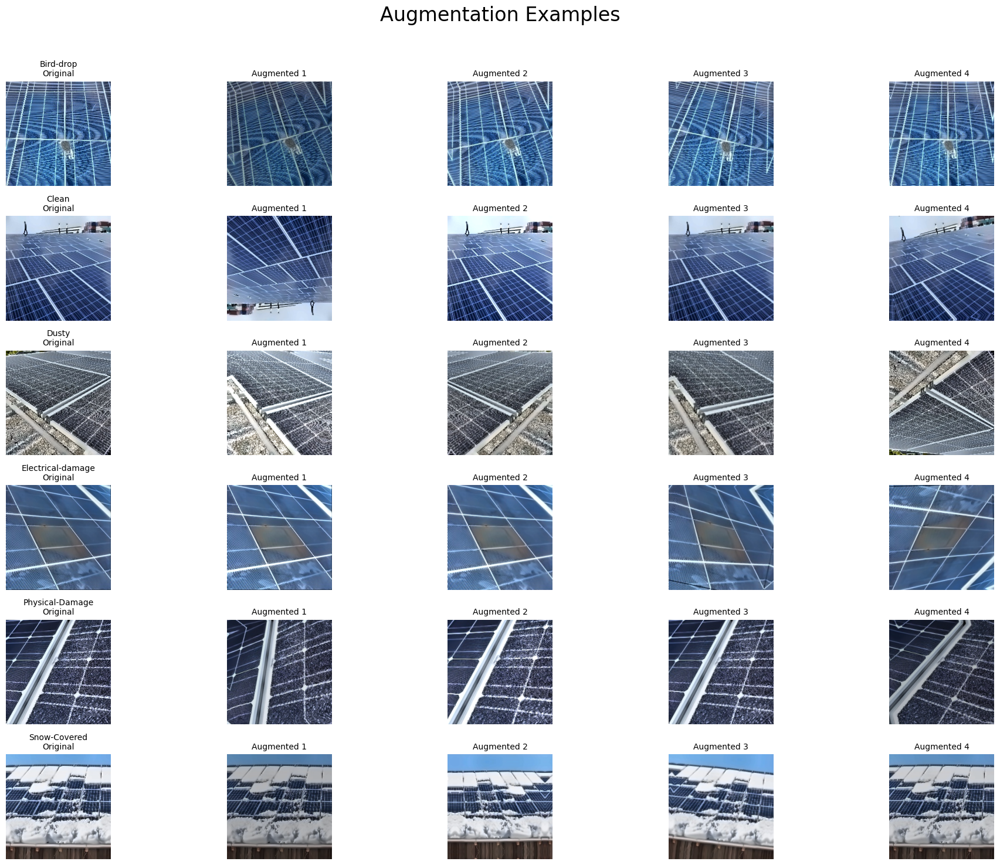

In [13]:

print("\nVisualizing augmentation examples...")
fig, axes = plt.subplots(len(classes), 5, figsize=(20, 15))
fig.suptitle('Augmentation Examples', fontsize=24)

for i, cls in enumerate(classes):
    class_train_path = os.path.join(train_dir, cls)
    image_files = get_image_files(class_train_path)
    if image_files:
        img_path = random.choice(image_files)
        original_img = cv2.imread(img_path)
        axes[i, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"{cls}\nOriginal", fontsize=10)
        axes[i, 0].axis('off')
        for j in range(1, 5):
            aug_img = original_img.copy()
            for func in random.sample(augmentations, random.randint(1, 2)): aug_img = func(aug_img)
            axes[i, j].imshow(cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB))
            axes[i, j].set_title(f"Augmented {j}", fontsize=10)
            axes[i, j].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### --- Final count verification ---

In [14]:

print("\n--- Final Augmented Training Set Counts ---")
total_aug_images = 0
for cls in classes:
    count = len(get_image_files(os.path.join(aug_train_dir, cls)))
    print(f"- {cls}: {count} images")
    total_aug_images += count
print(f"Total augmented training images: {total_aug_images}")

print(f"\nData preparation is complete. Augmented training data is in '{aug_train_dir}'.")


--- Final Augmented Training Set Counts ---
- Bird-drop: 1000 images
- Clean: 1000 images
- Dusty: 1000 images
- Electrical-damage: 1000 images
- Physical-Damage: 1000 images
- Snow-Covered: 1000 images
Total augmented training images: 6000

Data preparation is complete. Augmented training data is in '/kaggle/working/train_augmented'.


In [ ]:


# This script trains and evaluates multiple transfer learning models, including both
# traditional CNNs and modern Vision Transformers, on the prepared solar panel dataset.
#
# - It loads the augmented training set and the original validation/test sets.
# - A generic training function handles the training loop with early stopping.
# - A comprehensive evaluation function calculates and visualizes a wide range of metrics:
#   - Classification Report (Accuracy, Precision, Recall, F1)
#   - Confusion Matrix
#   - Cohen's Kappa, Matthews Correlation Coefficient (MCC)
#   - Mean PPV & NPV
#   - ROC AUC and PR AUC curves
# - It measures performance metrics like training/inference time and memory usage.
# - Finally, it presents a summary comparing all models.

# PHASE 2 - MODEL TRAINING & EVALUATION

In [42]:
#======================================================================
# 1. SETUP AND IMPORTS
#======================================================================
import os
import time
import psutil
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.optim.lr_scheduler import ReduceLROnPlateau
import timm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    classification_report, confusion_matrix, cohen_kappa_score,
    matthews_corrcoef, roc_auc_score, average_precision_score,
    roc_curve, precision_recall_curve
)
import warnings

# Suppress minor warnings for cleaner output
warnings.filterwarnings("ignore", category=UserWarning)

print("Libraries imported successfully.")

Libraries imported successfully.


## 2. CONFIGURATION

In [43]:

# These paths point to the output of the 1_data_preparation.py script
AUG_TRAIN_DIR = "/kaggle/working/train_augmented"
VAL_DIR = "/kaggle/working/solar_panel_split/val"
TEST_DIR = "/kaggle/working/solar_panel_split/test"
MODEL_SAVE_PATH = "/kaggle/working/models/"

os.makedirs(MODEL_SAVE_PATH, exist_ok=True)

### 2. CONFIGURATION

In [44]:

BATCH_SIZE = 32
NUM_EPOCHS = 40
PATIENCE = 5
NUM_CLASSES = 6 # As per our dataset
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")


Using device: cuda


### 7 Traditional CNN Architecture

In [45]:

s
cnn_models_to_train = [
    "vgg19_bn",
    "resnet50",
    "efficientnet_b0",
    "mobilenet_v2_100",
    "squeezenet1_1",
    "shufflenetv2_x1_0",
    "inception_v3"
]

### 5 Vision Transformer Architectures

In [46]:

transformer_models_to_train = [
    "swin_tiny_patch4_window7_224",
    "vit_tiny_patch16_224",
    "levit_128s",
    "deit_tiny_patch16_224",
    "mobilevit_s"
]

all_models_to_train = cnn_models_to_train + transformer_models_to_train

## 3. DATA LOADING

In [47]:

# Normalization values are standard for ImageNet pre-trained models
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'eval': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [48]:
# Create datasets
try:
    train_dataset = datasets.ImageFolder(root=AUG_TRAIN_DIR, transform=data_transforms['train'])
    val_dataset = datasets.ImageFolder(root=VAL_DIR, transform=data_transforms['eval'])
    test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=data_transforms['eval'])

    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

    class_names = train_dataset.classes
    print(f"\nData loaded successfully. Found {len(class_names)} classes: {class_names}")

except FileNotFoundError:
    print("\nError: Data directories not found. Please run the '1_data_preparation.py' script first.")
    # Exit gracefully if data is not available
    exit()



Data loaded successfully. Found 6 classes: ['Bird-drop', 'Clean', 'Dusty', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']


## 4. EVALUATION AND VISUALIZATION FUNCTIONS

In [49]:

def plot_confusion_matrix(cm, classes, title="Confusion Matrix"):
    """This function prints and plots the confusion matrix."""
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
    plt.title(title, fontsize=16)
    plt.ylabel("Actual", fontsize=12)
    plt.xlabel("Predicted", fontsize=12)
    plt.show()

def full_evaluation_report(y_true, y_pred, y_prob, title, class_names):
    """Generates a full report including metrics and plots."""
    print(f"\n{'='*20} {title} {'='*20}")
    
    # 1. Classification Report
    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    # 2. Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plot_confusion_matrix(cm, class_names, title=f"{title} Confusion Matrix")

    # 3. Advanced Metrics
    mcc = matthews_corrcoef(y_true, y_pred)
    kappa = cohen_kappa_score(y_true, y_pred)
    
    TP = np.diag(cm)
    FP = cm.sum(axis=0) - TP
    FN = cm.sum(axis=1) - TP
    TN = cm.sum() - (TP + FP + FN)
    
    PPV = np.mean(TP / (TP + FP + 1e-8)) # Mean Precision
    NPV = np.mean(TN / (TN + FN + 1e-8)) # Mean Negative Predictive Value
    
    print(f"Matthews Corrcoef (MCC): {mcc:.4f}")
    print(f"Cohen's Kappa: {kappa:.4f}")
    print(f"Mean PPV (Precision): {PPV:.4f}")
    print(f"Mean NPV: {NPV:.4f}")

    # 4. ROC and PR Curves
    y_onehot = np.eye(len(class_names))[y_true]
    
    # ROC Curve
    plt.figure(figsize=(10, 8))
    for i in range(len(class_names)):
        fpr, tpr, _ = roc_curve(y_onehot[:, i], y_prob[:, i])
        roc_auc = roc_auc_score(y_onehot[:, i], y_prob[:, i])
        plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f'{title} ROC Curve', fontsize=16)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.show()

    # PR Curve
    plt.figure(figsize=(10, 8))
    for i in range(len(class_names)):
        precision, recall, _ = precision_recall_curve(y_onehot[:, i], y_prob[:, i])
        pr_auc = average_precision_score(y_onehot[:, i], y_prob[:, i])
        plt.plot(recall, precision, label=f'{class_names[i]} (AP = {pr_auc:.4f})')
    plt.title(f'{title} Precision-Recall Curve', fontsize=16)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend(loc='lower left')
    plt.show()

def get_predictions(model, loader, device):
    """Helper function to get predictions and labels from a dataloader."""
    model.eval()
    all_labels = []
    all_preds = []
    all_probs = []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    return np.array(all_labels), np.array(all_preds), np.array(all_probs)

## 5. TRAINING AND EVALUATION WORKFLOW

In [50]:

def train_and_evaluate_model(model_name, num_classes, train_loader, val_loader, test_loader, device):
    """Main function to train a single model and return its performance."""
    print(f"\n{'='*25} Training: {model_name.upper()} {'='*25}")
    
    # --- Model Initialization ---
    model = timm.create_model(model_name, pretrained=True, num_classes=num_classes)
    model.to(device)
    
    # --- Reset memory stats for accurate per-model measurement ---
    if torch.cuda.is_available():
        torch.cuda.reset_peak_memory_stats(device)
        
    # --- Optimizer, Scheduler, Loss ---
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = ReduceLROnPlateau(optimizer, mode="min", patience=3, factor=0.5, verbose=True)

    # --- Training Loop ---
    best_val_loss = float("inf")
    patience_counter = 0
    model_path = os.path.join(MODEL_SAVE_PATH, f"best_{model_name}.pth")
    
    train_start_time = time.time()
    
    for epoch in range(NUM_EPOCHS):
        # Training phase
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        
        train_loss = running_loss / len(train_loader.dataset)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels.data)
        
        val_loss /= len(val_loader.dataset)
        val_acc = val_correct.double() / len(val_loader.dataset)

        print(f"Epoch {epoch+1}/{NUM_EPOCHS} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")
        
        scheduler.step(val_loss)
        
        # Early stopping logic
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save(model.state_dict(), model_path)
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print("--- Early stopping triggered! ---")
                break
    
    train_time = time.time() - train_start_time
    print(f"Training finished in {train_time:.2f}s. Best model saved to {model_path}")
    
    # --- Final Evaluation ---
    if not os.path.exists(model_path):
        print(f"ERROR: Model file not found at {model_path}. Skipping evaluation.")
        return None
        
    model.load_state_dict(torch.load(model_path))
    
    # Inference Time
    inf_start_time = time.time()
    test_labels, test_preds, test_probs = get_predictions(model, test_loader, device)
    inference_time = time.time() - inf_start_time

    # Get final memory usage
    gpu_mem_usage = torch.cuda.max_memory_allocated(device) / (1024**2) if torch.cuda.is_available() else 0

    # Generate full report for the test set
    full_evaluation_report(test_labels, test_preds, test_probs, f"Test Set - {model_name}", class_names)

    test_accuracy = (test_labels == test_preds).mean()

    return {
        "Model": model_name,
        "Test Accuracy": test_accuracy,
        "Training Time (s)": train_time,
        "Inference Time (s)": inference_time,
        "GPU Memory (MB)": gpu_mem_usage
    }

## 5. TRAINING AND EVALUATION WORKFLOW

In [51]:

def train_and_evaluate_model(model_name, num_classes, train_loader, val_loader, test_loader, device):
    """Main function to train a single model and return its performance."""
    print(f"\n{'='*25} Training: {model_name.upper()} {'='*25}")
    
    # --- Model Initialization ---
    model = timm.create_model(model_name, pretrained=True, num_classes=num_classes)
    model.to(device)
    
    # --- Reset memory stats for accurate per-model measurement ---
    if torch.cuda.is_available():
        torch.cuda.reset_peak_memory_stats(device)
        
    # --- Optimizer, Scheduler, Loss ---
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = ReduceLROnPlateau(optimizer, mode="min", patience=3, factor=0.5, verbose=True)

    # --- Training Loop ---
    best_val_loss = float("inf")
    patience_counter = 0
    model_path = os.path.join(MODEL_SAVE_PATH, f"best_{model_name}.pth")
    
    train_start_time = time.time()
    
    for epoch in range(NUM_EPOCHS):
        # Training phase
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        
        train_loss = running_loss / len(train_loader.dataset)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds == labels.data)
        
        val_loss /= len(val_loader.dataset)
        val_acc = val_correct.double() / len(val_loader.dataset)

        print(f"Epoch {epoch+1}/{NUM_EPOCHS} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")
        
        scheduler.step(val_loss)
        
        # Early stopping logic
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save(model.state_dict(), model_path)
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print("--- Early stopping triggered! ---")
                break
    
    train_time = time.time() - train_start_time
    print(f"Training finished in {train_time:.2f}s. Best model saved to {model_path}")
    
    # --- Final Evaluation ---
    if not os.path.exists(model_path):
        print(f"ERROR: Model file not found at {model_path}. Skipping evaluation.")
        return None
        
    model.load_state_dict(torch.load(model_path))
    
    # Inference Time
    inf_start_time = time.time()
    test_labels, test_preds, test_probs = get_predictions(model, test_loader, device)
    inference_time = time.time() - inf_start_time

    # Get final memory usage
    gpu_mem_usage = torch.cuda.max_memory_allocated(device) / (1024**2) if torch.cuda.is_available() else 0

    # Generate full report for the test set
    full_evaluation_report(test_labels, test_preds, test_probs, f"Test Set - {model_name}", class_names)

    test_accuracy = (test_labels == test_preds).mean()

    return {
        "Model": model_name,
        "Test Accuracy": test_accuracy,
        "Training Time (s)": train_time,
        "Inference Time (s)": inference_time,
        "GPU Memory (MB)": gpu_mem_usage
    }

## 6. MAIN EXECUTION BLOCK


========================= Training: VGG19_BN =========================
Epoch 1/40 | Train Loss: 0.3077 | Val Loss: 0.6497 | Val Acc: 0.8462
Epoch 2/40 | Train Loss: 0.0656 | Val Loss: 1.1621 | Val Acc: 0.7949
Epoch 3/40 | Train Loss: 0.0750 | Val Loss: 1.2288 | Val Acc: 0.8077
Epoch 4/40 | Train Loss: 0.0578 | Val Loss: 0.7877 | Val Acc: 0.8846
Epoch 5/40 | Train Loss: 0.0396 | Val Loss: 0.8961 | Val Acc: 0.8205
Epoch 6/40 | Train Loss: 0.0193 | Val Loss: 0.8715 | Val Acc: 0.8333
--- Early stopping triggered! ---
Training finished in 393.13s. Best model saved to /kaggle/working/models/best_vgg19_bn.pth

==================== Test Set - vgg19_bn ====================
Classification Report:
                   precision    recall  f1-score   support

        Bird-drop     0.9375    0.8824    0.9091        17
            Clean     0.9444    0.8947    0.9189        19
            Dusty     0.8095    0.8947    0.8500        19
Electrical-damage     1.0000    1.0000    1.0000        10
  Physi

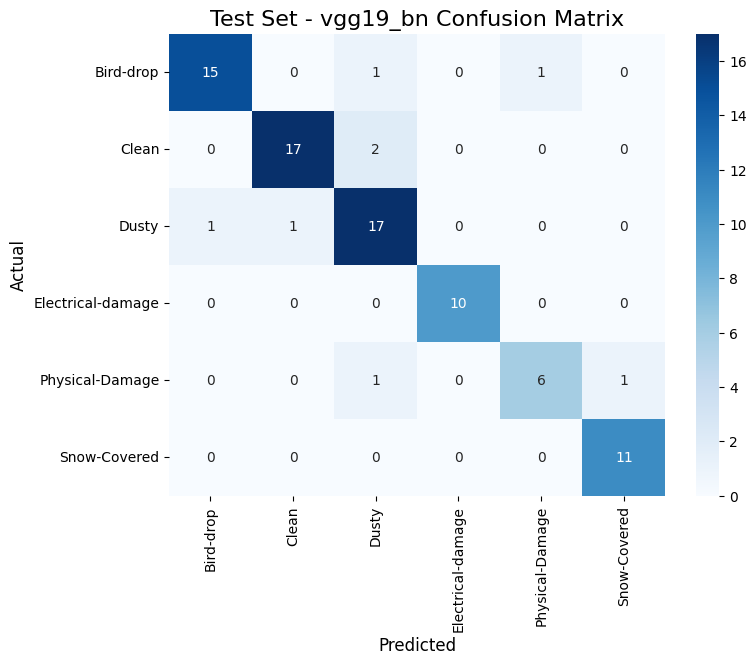

Matthews Corrcoef (MCC): 0.8838
Cohen's Kappa: 0.8832
Mean PPV (Precision): 0.9109
Mean NPV: 0.9804


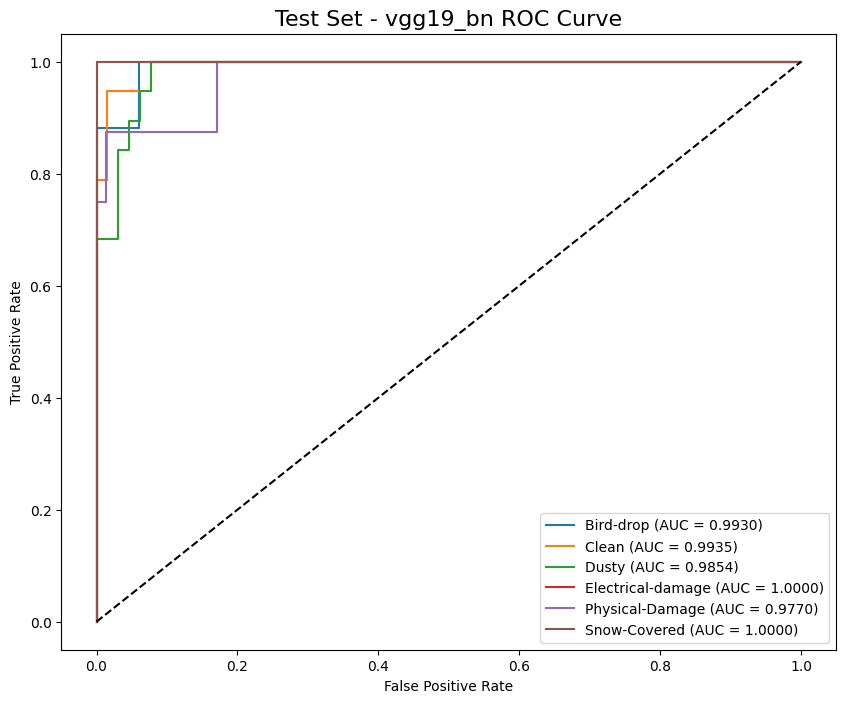

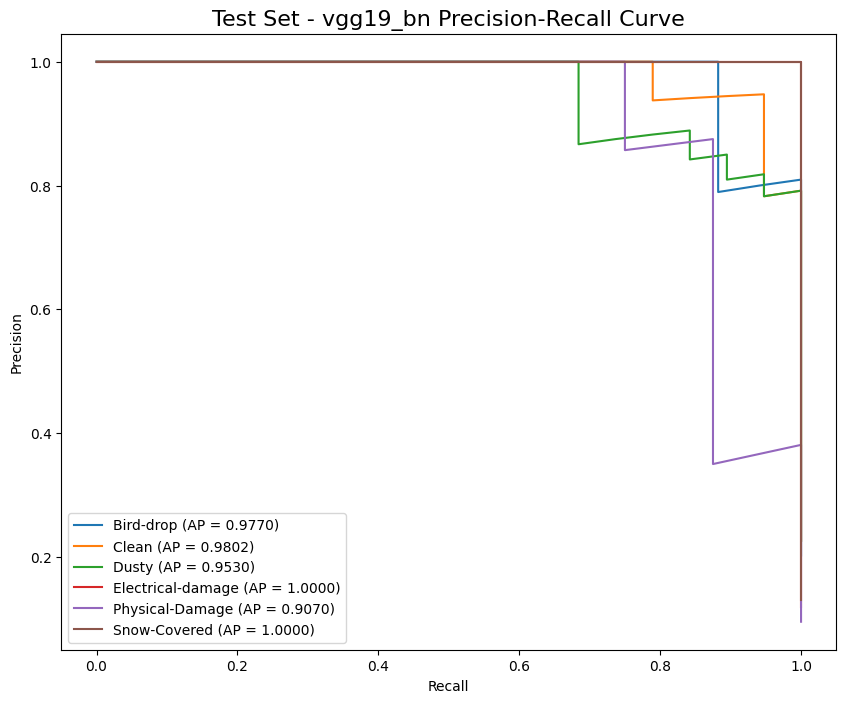


========================= Training: RESNET50 =========================
Epoch 1/40 | Train Loss: 1.4710 | Val Loss: 0.9273 | Val Acc: 0.7821
Epoch 2/40 | Train Loss: 0.5196 | Val Loss: 0.5526 | Val Acc: 0.8205
Epoch 3/40 | Train Loss: 0.1718 | Val Loss: 0.5790 | Val Acc: 0.8462
Epoch 4/40 | Train Loss: 0.0814 | Val Loss: 0.5928 | Val Acc: 0.8846
Epoch 5/40 | Train Loss: 0.0442 | Val Loss: 0.6497 | Val Acc: 0.8846
Epoch 6/40 | Train Loss: 0.0377 | Val Loss: 0.6357 | Val Acc: 0.8718
Epoch 7/40 | Train Loss: 0.0223 | Val Loss: 0.6824 | Val Acc: 0.8718
--- Early stopping triggered! ---
Training finished in 224.64s. Best model saved to /kaggle/working/models/best_resnet50.pth

==================== Test Set - resnet50 ====================
Classification Report:
                   precision    recall  f1-score   support

        Bird-drop     0.8824    0.8824    0.8824        17
            Clean     0.8261    1.0000    0.9048        19
            Dusty     0.8000    0.6316    0.7059        

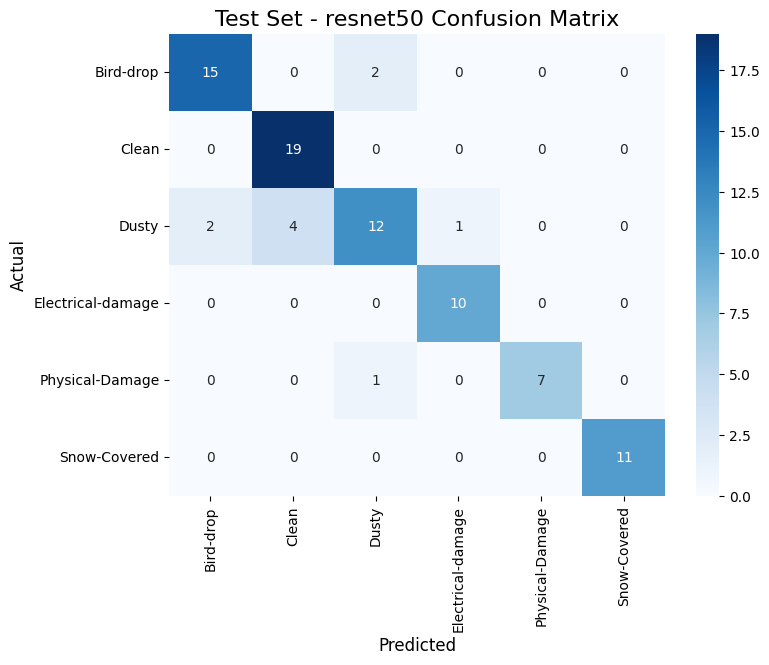

Matthews Corrcoef (MCC): 0.8566
Cohen's Kappa: 0.8541
Mean PPV (Precision): 0.9029
Mean NPV: 0.9760


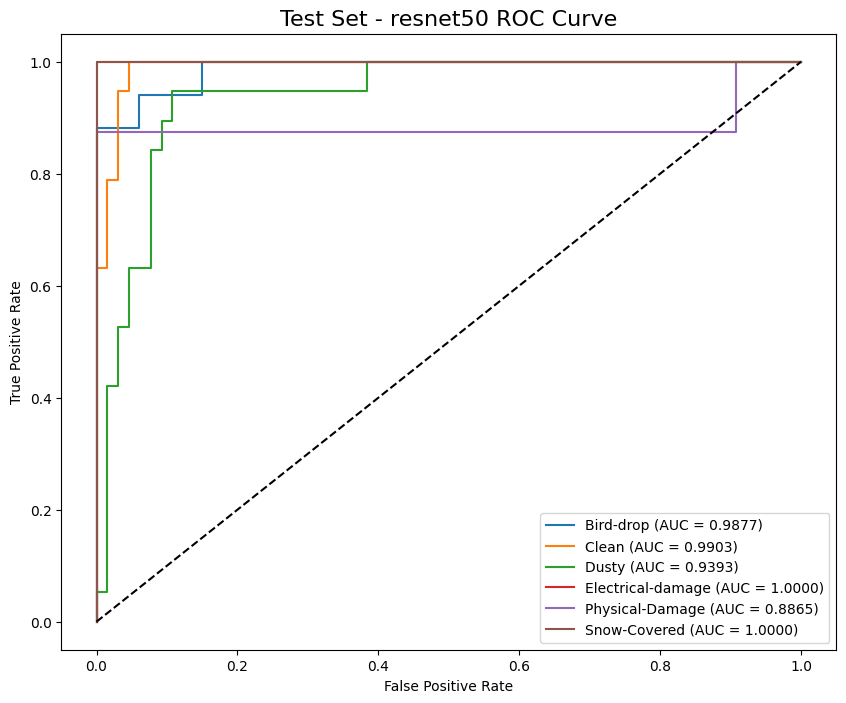

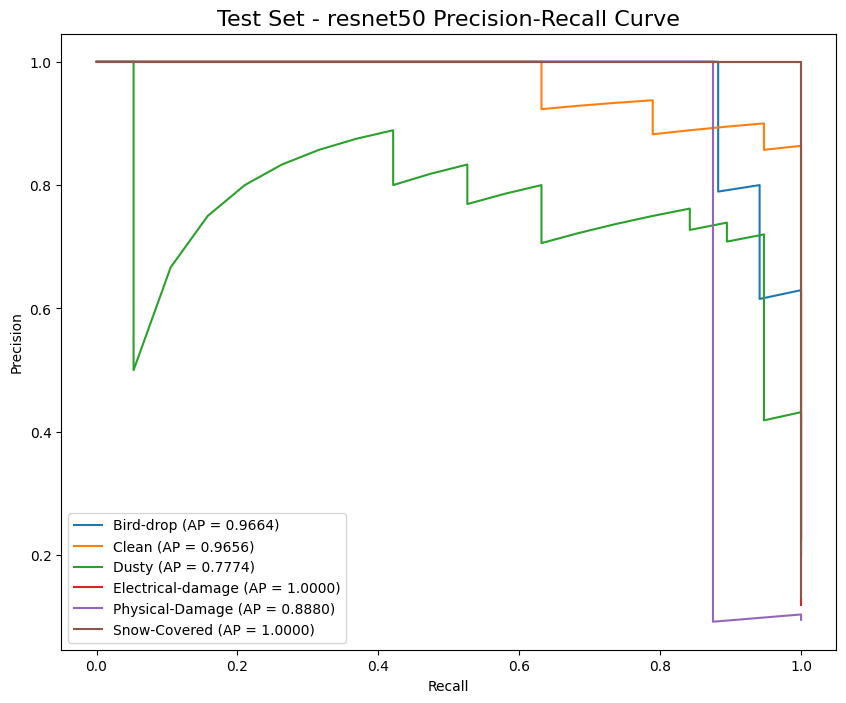


========================= Training: EFFICIENTNET_B0 =========================
Epoch 1/40 | Train Loss: 0.6840 | Val Loss: 0.7327 | Val Acc: 0.8077
Epoch 2/40 | Train Loss: 0.0623 | Val Loss: 0.7469 | Val Acc: 0.7949
Epoch 3/40 | Train Loss: 0.0266 | Val Loss: 0.7873 | Val Acc: 0.7821
Epoch 4/40 | Train Loss: 0.0186 | Val Loss: 0.7248 | Val Acc: 0.7949
Epoch 5/40 | Train Loss: 0.0159 | Val Loss: 0.7210 | Val Acc: 0.8333
Epoch 6/40 | Train Loss: 0.0115 | Val Loss: 0.7964 | Val Acc: 0.8205
Epoch 7/40 | Train Loss: 0.0139 | Val Loss: 0.7958 | Val Acc: 0.8333
Epoch 8/40 | Train Loss: 0.0106 | Val Loss: 0.8469 | Val Acc: 0.8333
Epoch 9/40 | Train Loss: 0.0094 | Val Loss: 0.8505 | Val Acc: 0.8462
Epoch 10/40 | Train Loss: 0.0063 | Val Loss: 0.9030 | Val Acc: 0.8205
--- Early stopping triggered! ---
Training finished in 208.38s. Best model saved to /kaggle/working/models/best_efficientnet_b0.pth

==================== Test Set - efficientnet_b0 ====================
Classification Report:
     

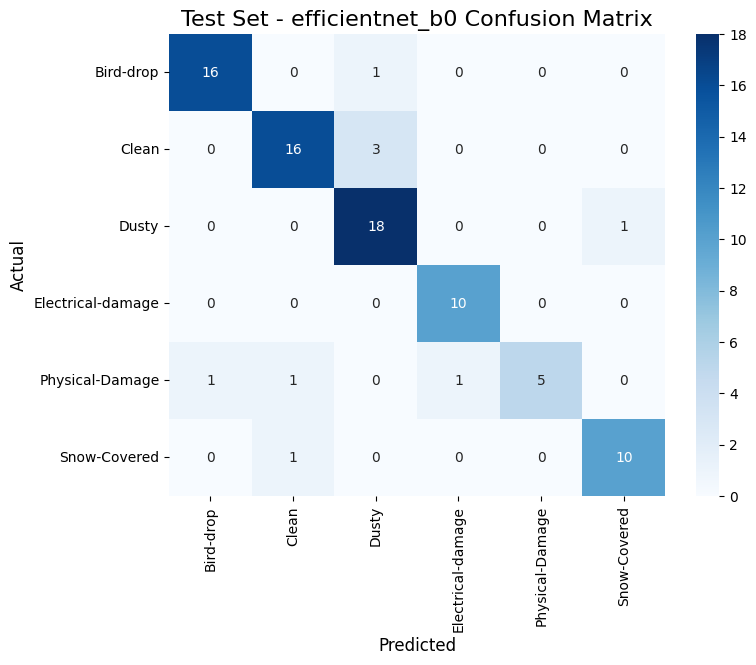

Matthews Corrcoef (MCC): 0.8697
Cohen's Kappa: 0.8682
Mean PPV (Precision): 0.9111
Mean NPV: 0.9786


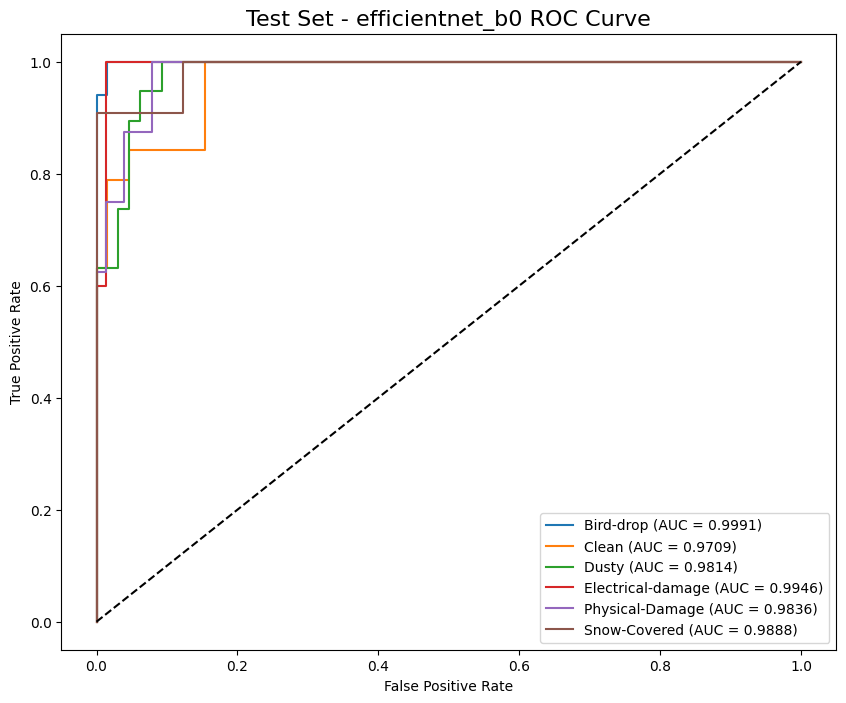

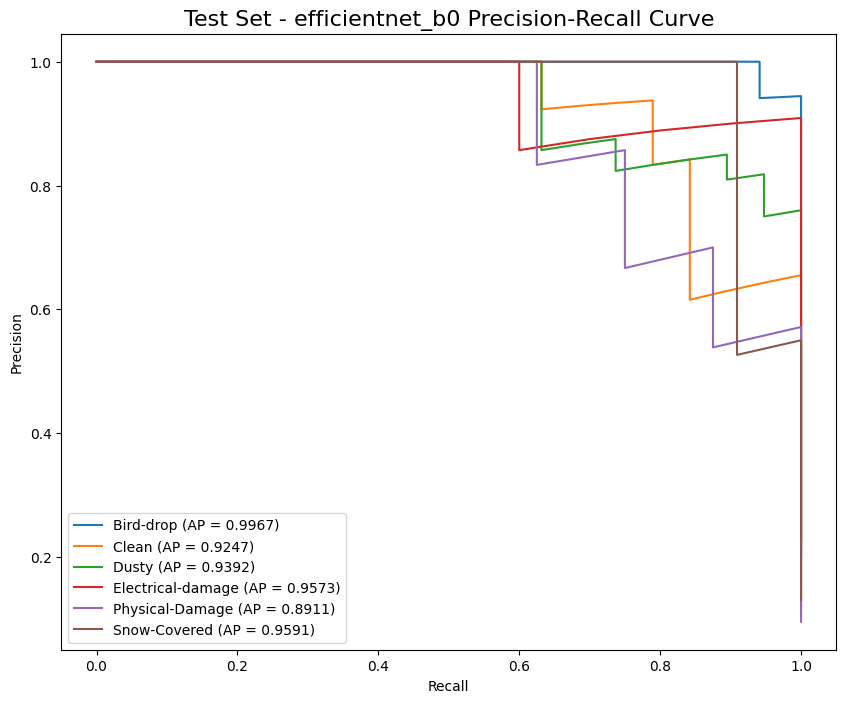


========================= Training: MOBILENET_V2_100 =========================

ERROR: Could not train model mobilenet_v2_100. Reason: Unknown model (mobilenet_v2_100)


========================= Training: SQUEEZENET1_1 =========================

ERROR: Could not train model squeezenet1_1. Reason: Unknown model (squeezenet1_1)


========================= Training: SHUFFLENETV2_X1_0 =========================

ERROR: Could not train model shufflenetv2_x1_0. Reason: Unknown model (shufflenetv2_x1_0)


========================= Training: INCEPTION_V3 =========================
Epoch 1/40 | Train Loss: 0.4081 | Val Loss: 0.9642 | Val Acc: 0.7949
Epoch 2/40 | Train Loss: 0.0526 | Val Loss: 1.0352 | Val Acc: 0.8077
Epoch 3/40 | Train Loss: 0.0358 | Val Loss: 1.3226 | Val Acc: 0.7692
Epoch 4/40 | Train Loss: 0.0268 | Val Loss: 1.3958 | Val Acc: 0.7949
Epoch 5/40 | Train Loss: 0.0292 | Val Loss: 1.2330 | Val Acc: 0.7564
Epoch 6/40 | Train Loss: 0.0256 | Val Loss: 1.1314 | Val Acc: 0.8077
--- Ea

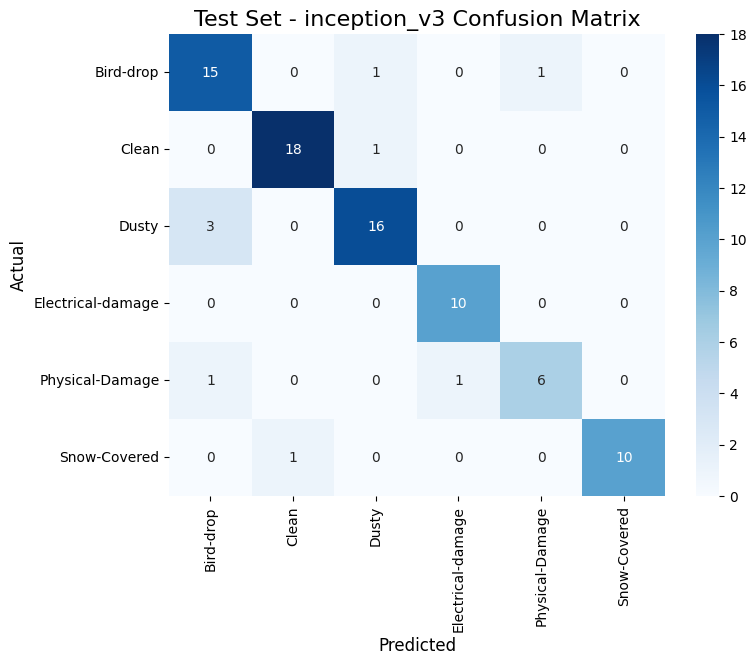

Matthews Corrcoef (MCC): 0.8692
Cohen's Kappa: 0.8686
Mean PPV (Precision): 0.8987
Mean NPV: 0.9782


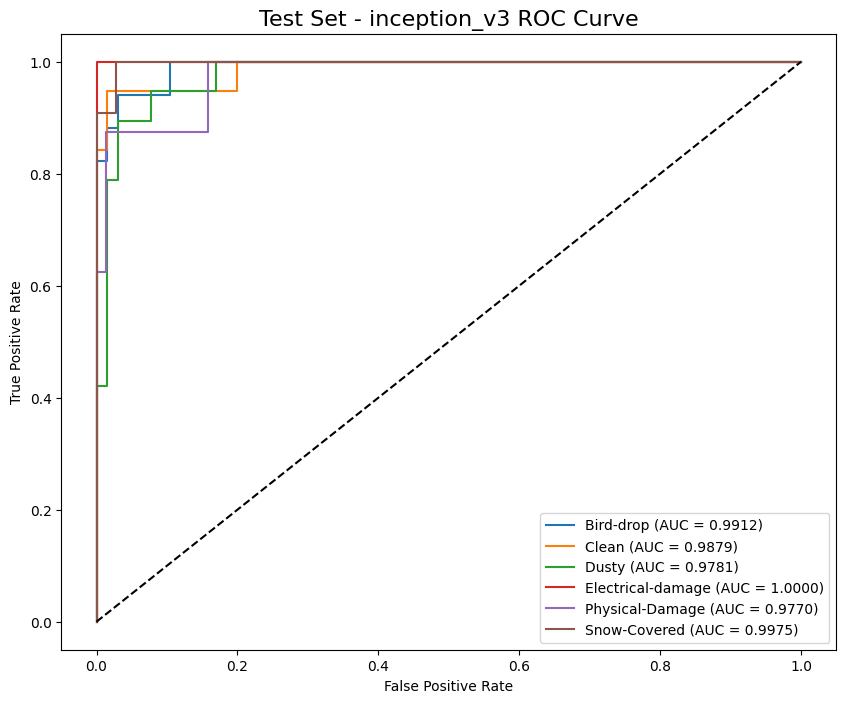

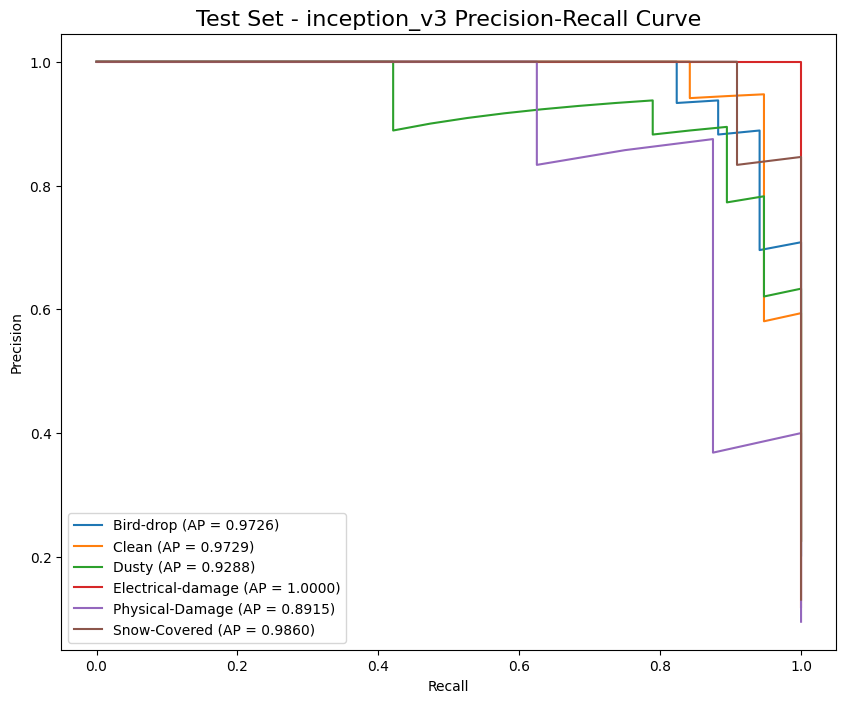


========================= Training: SWIN_TINY_PATCH4_WINDOW7_224 =========================
Epoch 1/40 | Train Loss: 0.3227 | Val Loss: 0.7931 | Val Acc: 0.8462
Epoch 2/40 | Train Loss: 0.0466 | Val Loss: 1.2244 | Val Acc: 0.7949
Epoch 3/40 | Train Loss: 0.0531 | Val Loss: 1.0013 | Val Acc: 0.8205
Epoch 4/40 | Train Loss: 0.0341 | Val Loss: 0.7741 | Val Acc: 0.8462
Epoch 5/40 | Train Loss: 0.0221 | Val Loss: 1.5074 | Val Acc: 0.7949
Epoch 6/40 | Train Loss: 0.0334 | Val Loss: 1.0897 | Val Acc: 0.8333
Epoch 7/40 | Train Loss: 0.0448 | Val Loss: 0.9745 | Val Acc: 0.8077
Epoch 8/40 | Train Loss: 0.0232 | Val Loss: 1.0663 | Val Acc: 0.8590
Epoch 9/40 | Train Loss: 0.0103 | Val Loss: 1.0303 | Val Acc: 0.8462
--- Early stopping triggered! ---
Training finished in 418.16s. Best model saved to /kaggle/working/models/best_swin_tiny_patch4_window7_224.pth

==================== Test Set - swin_tiny_patch4_window7_224 ====================
Classification Report:
                   precision    reca

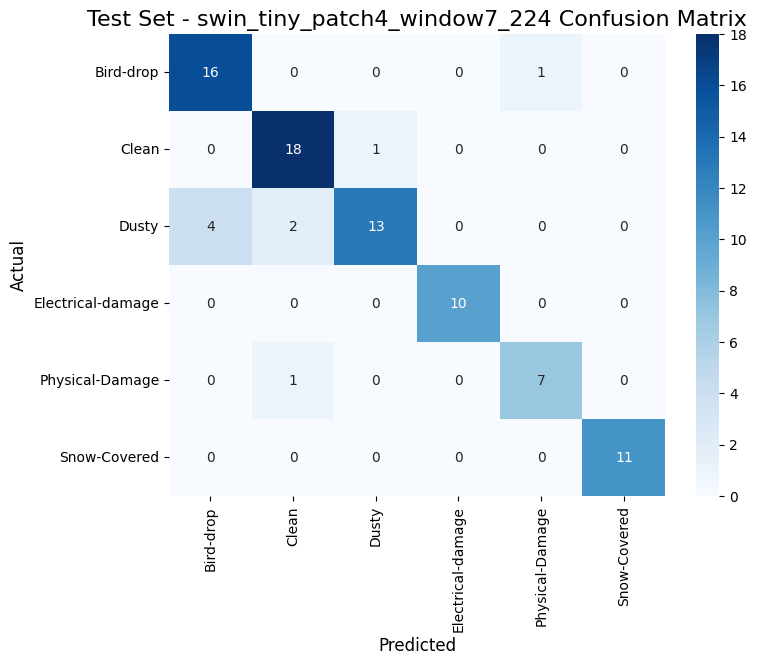

Matthews Corrcoef (MCC): 0.8718
Cohen's Kappa: 0.8689
Mean PPV (Precision): 0.9101
Mean NPV: 0.9783


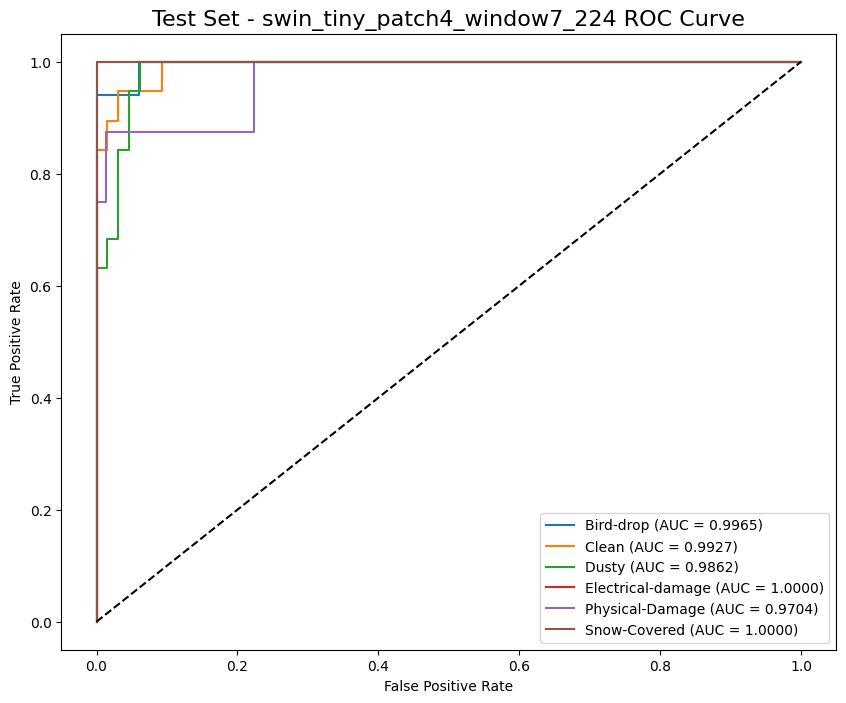

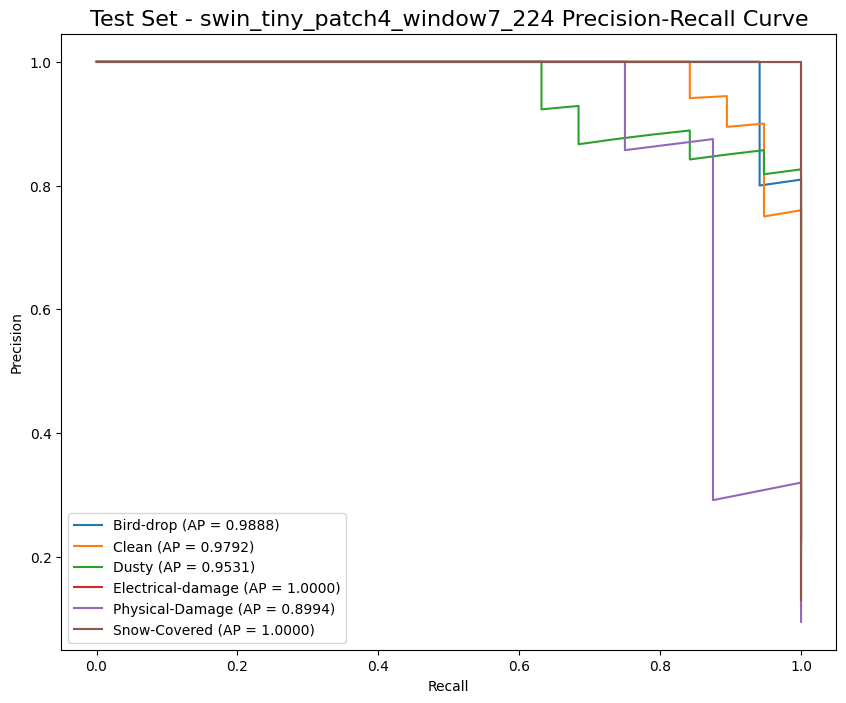


========================= Training: VIT_TINY_PATCH16_224 =========================
Epoch 1/40 | Train Loss: 0.4211 | Val Loss: 0.7505 | Val Acc: 0.7821
Epoch 2/40 | Train Loss: 0.0494 | Val Loss: 0.9585 | Val Acc: 0.7692
Epoch 3/40 | Train Loss: 0.0194 | Val Loss: 0.8684 | Val Acc: 0.8077
Epoch 4/40 | Train Loss: 0.0492 | Val Loss: 1.1433 | Val Acc: 0.7692
Epoch 5/40 | Train Loss: 0.0399 | Val Loss: 0.9436 | Val Acc: 0.8333
Epoch 6/40 | Train Loss: 0.0086 | Val Loss: 0.8571 | Val Acc: 0.8333
--- Early stopping triggered! ---
Training finished in 89.31s. Best model saved to /kaggle/working/models/best_vit_tiny_patch16_224.pth

==================== Test Set - vit_tiny_patch16_224 ====================
Classification Report:
                   precision    recall  f1-score   support

        Bird-drop     0.9412    0.9412    0.9412        17
            Clean     0.8947    0.8947    0.8947        19
            Dusty     0.8636    1.0000    0.9268        19
Electrical-damage     1.0000   

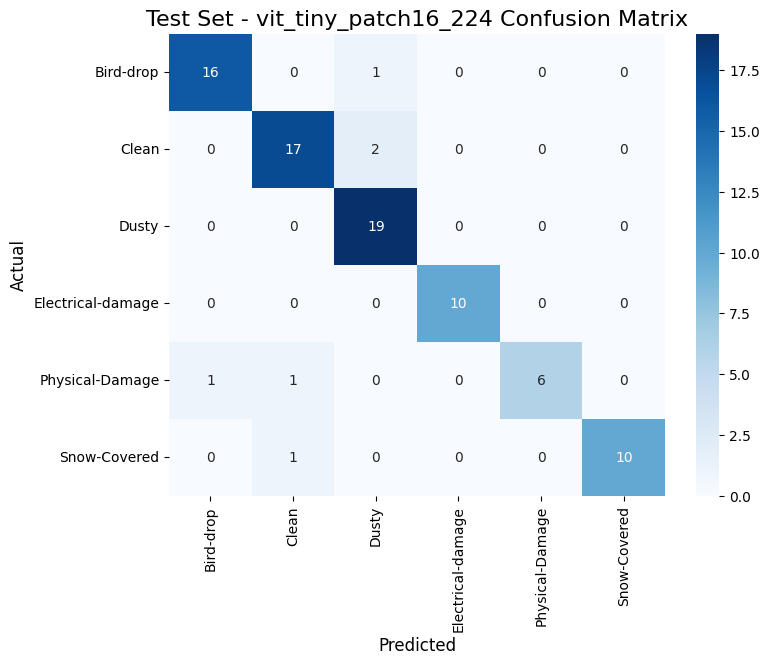

Matthews Corrcoef (MCC): 0.9132
Cohen's Kappa: 0.9120
Mean PPV (Precision): 0.9499
Mean NPV: 0.9859


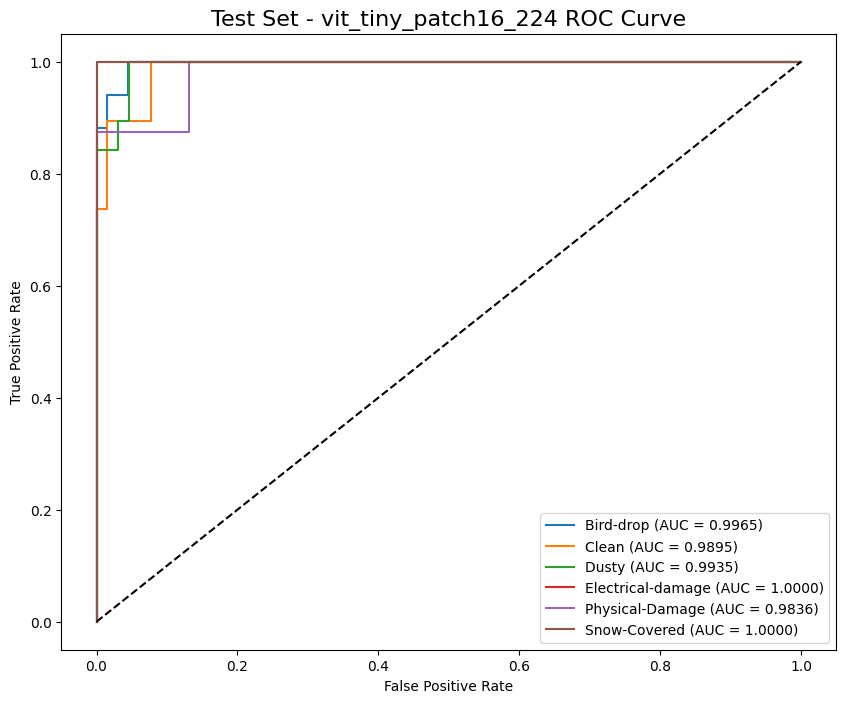

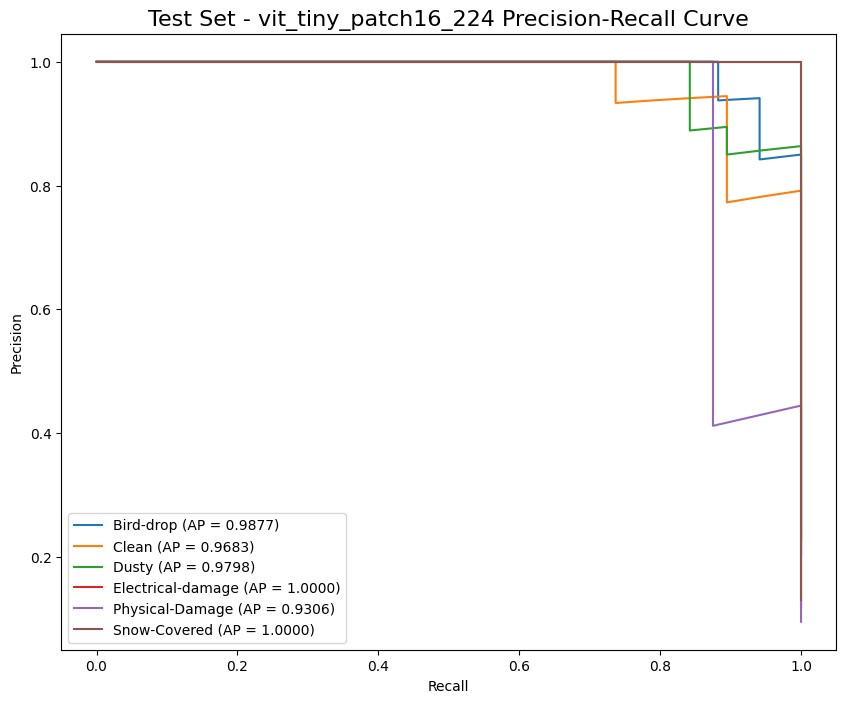


========================= Training: LEVIT_128S =========================
Epoch 1/40 | Train Loss: 1.2805 | Val Loss: 1.2265 | Val Acc: 0.7564
Epoch 2/40 | Train Loss: 0.5844 | Val Loss: 1.5905 | Val Acc: 0.7821
Epoch 3/40 | Train Loss: 0.2639 | Val Loss: 1.5925 | Val Acc: 0.7821
Epoch 4/40 | Train Loss: 0.1284 | Val Loss: 2.2197 | Val Acc: 0.7821
Epoch 5/40 | Train Loss: 0.0737 | Val Loss: 0.9217 | Val Acc: 0.8333
Epoch 6/40 | Train Loss: 0.0522 | Val Loss: 0.9282 | Val Acc: 0.8333
Epoch 7/40 | Train Loss: 0.0394 | Val Loss: 0.9094 | Val Acc: 0.8590
Epoch 8/40 | Train Loss: 0.0303 | Val Loss: 1.2157 | Val Acc: 0.8333
Epoch 9/40 | Train Loss: 0.0260 | Val Loss: 0.9862 | Val Acc: 0.8462
Epoch 10/40 | Train Loss: 0.0205 | Val Loss: 2.2988 | Val Acc: 0.8462
Epoch 11/40 | Train Loss: 0.0200 | Val Loss: 3.3012 | Val Acc: 0.8205
Epoch 12/40 | Train Loss: 0.0164 | Val Loss: 0.7714 | Val Acc: 0.8590
Epoch 13/40 | Train Loss: 0.0126 | Val Loss: 1.1574 | Val Acc: 0.8462
Epoch 14/40 | Train Loss:

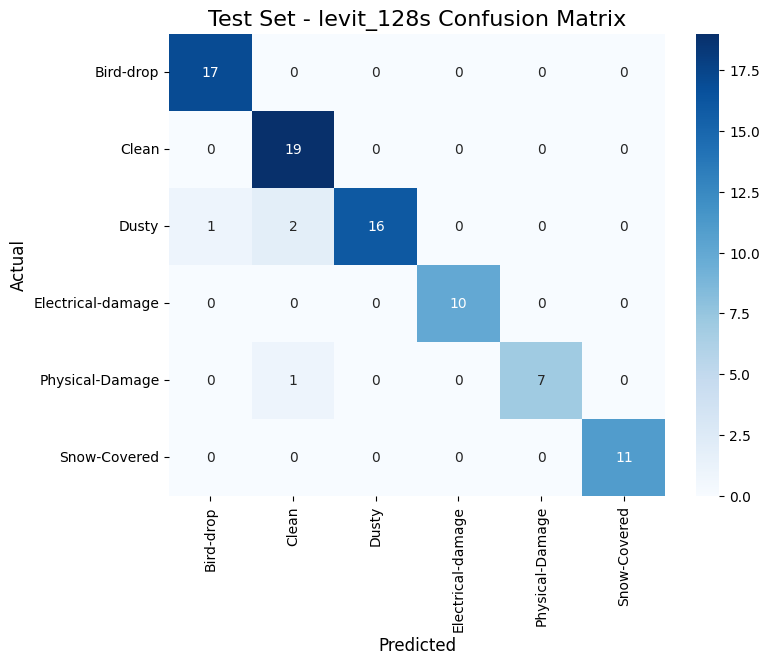

Matthews Corrcoef (MCC): 0.9432
Cohen's Kappa: 0.9416
Mean PPV (Precision): 0.9680
Mean NPV: 0.9905


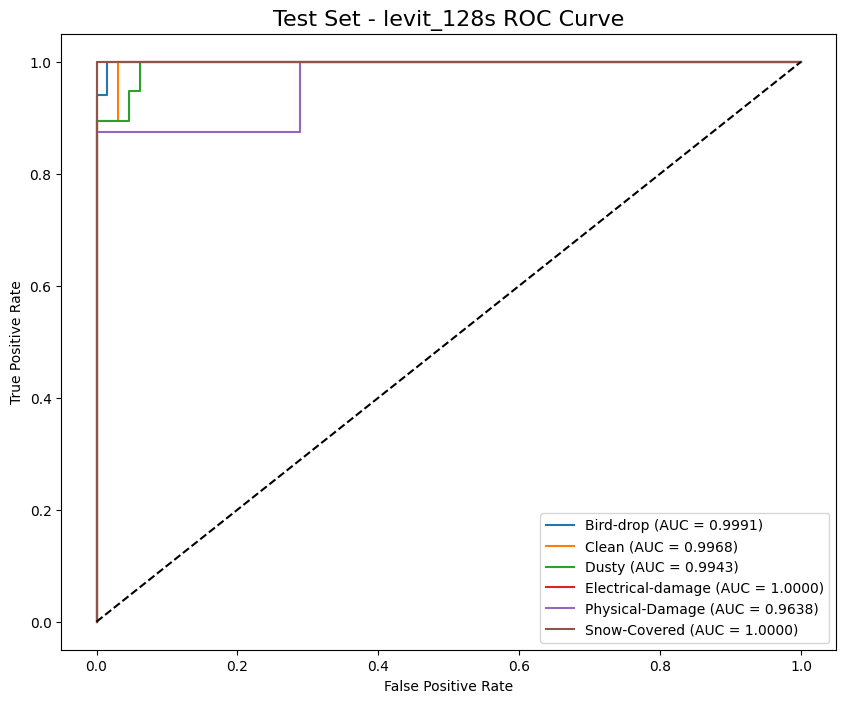

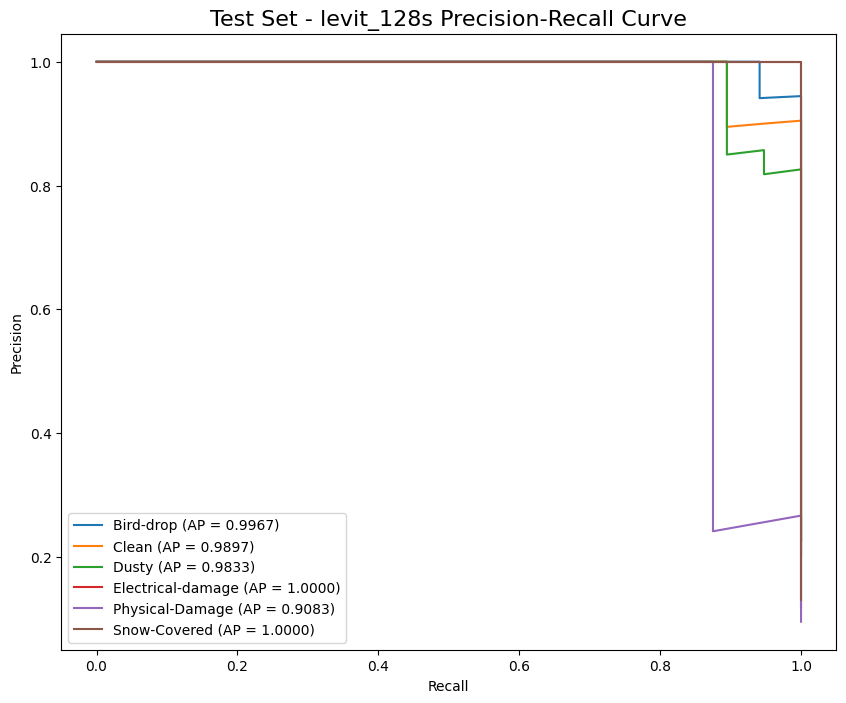


========================= Training: DEIT_TINY_PATCH16_224 =========================
Epoch 1/40 | Train Loss: 0.3751 | Val Loss: 0.6290 | Val Acc: 0.8205
Epoch 2/40 | Train Loss: 0.0491 | Val Loss: 0.7827 | Val Acc: 0.8333
Epoch 3/40 | Train Loss: 0.0502 | Val Loss: 0.7339 | Val Acc: 0.8333
Epoch 4/40 | Train Loss: 0.0346 | Val Loss: 0.6483 | Val Acc: 0.8333
Epoch 5/40 | Train Loss: 0.0323 | Val Loss: 0.8042 | Val Acc: 0.7949
Epoch 6/40 | Train Loss: 0.0097 | Val Loss: 0.8063 | Val Acc: 0.8333
--- Early stopping triggered! ---
Training finished in 89.22s. Best model saved to /kaggle/working/models/best_deit_tiny_patch16_224.pth

==================== Test Set - deit_tiny_patch16_224 ====================
Classification Report:
                   precision    recall  f1-score   support

        Bird-drop     1.0000    1.0000    1.0000        17
            Clean     0.8000    0.8421    0.8205        19
            Dusty     0.8095    0.8947    0.8500        19
Electrical-damage     1.0000

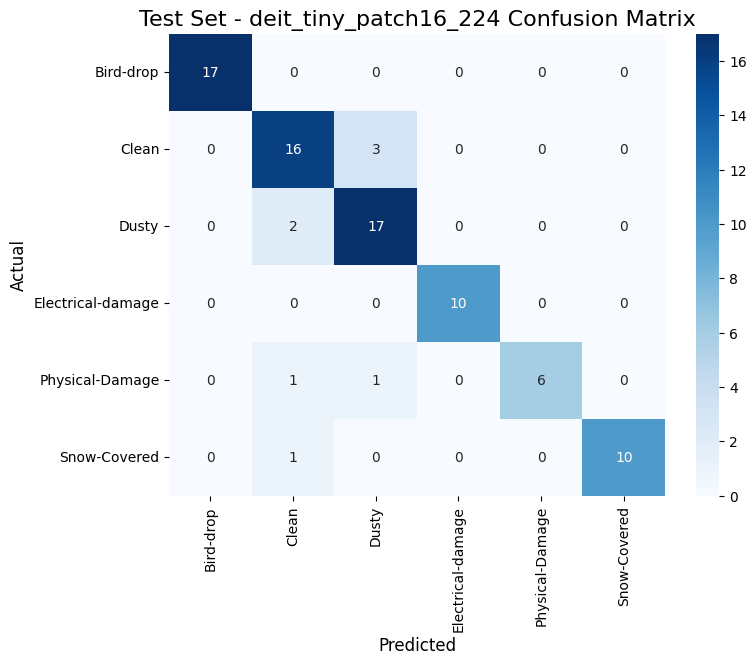

Matthews Corrcoef (MCC): 0.8835
Cohen's Kappa: 0.8827
Mean PPV (Precision): 0.9349
Mean NPV: 0.9804


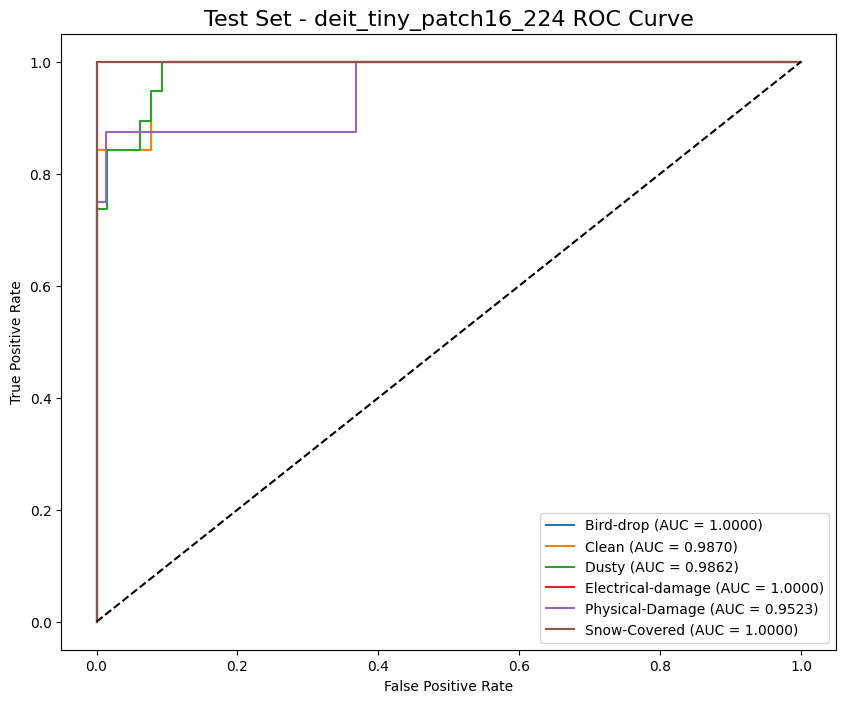

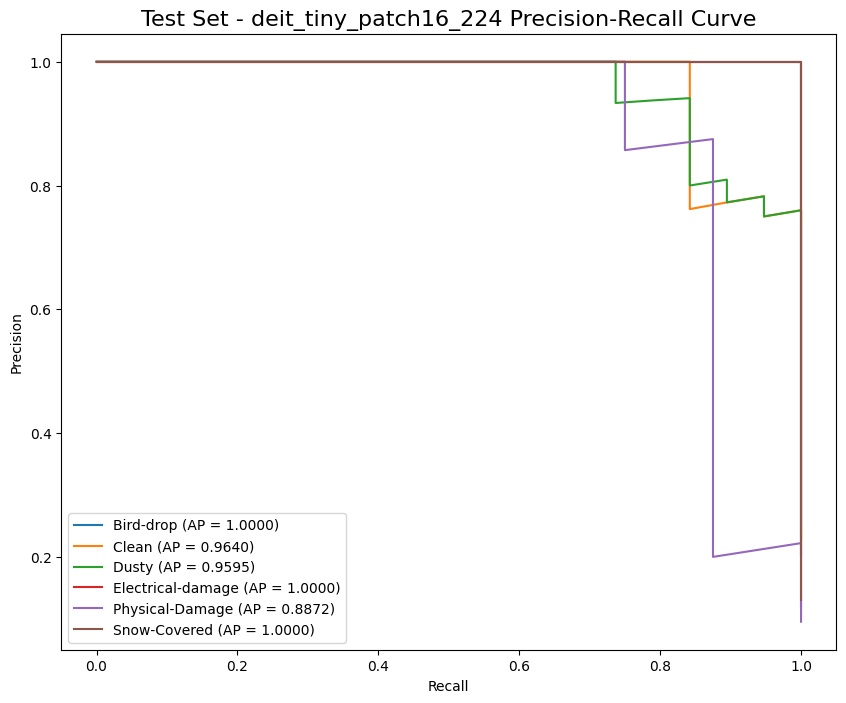


========================= Training: MOBILEVIT_S =========================
Epoch 1/40 | Train Loss: 1.1440 | Val Loss: 0.6064 | Val Acc: 0.8333
Epoch 2/40 | Train Loss: 0.2438 | Val Loss: 0.6778 | Val Acc: 0.8077
Epoch 3/40 | Train Loss: 0.0926 | Val Loss: 0.7264 | Val Acc: 0.8462
Epoch 4/40 | Train Loss: 0.0690 | Val Loss: 0.6398 | Val Acc: 0.8590
Epoch 5/40 | Train Loss: 0.0508 | Val Loss: 0.7534 | Val Acc: 0.8333
Epoch 6/40 | Train Loss: 0.0385 | Val Loss: 0.8033 | Val Acc: 0.8333
--- Early stopping triggered! ---
Training finished in 196.34s. Best model saved to /kaggle/working/models/best_mobilevit_s.pth

==================== Test Set - mobilevit_s ====================
Classification Report:
                   precision    recall  f1-score   support

        Bird-drop     1.0000    0.7647    0.8667        17
            Clean     0.9048    1.0000    0.9500        19
            Dusty     0.8824    0.7895    0.8333        19
Electrical-damage     0.8333    1.0000    0.9091        1

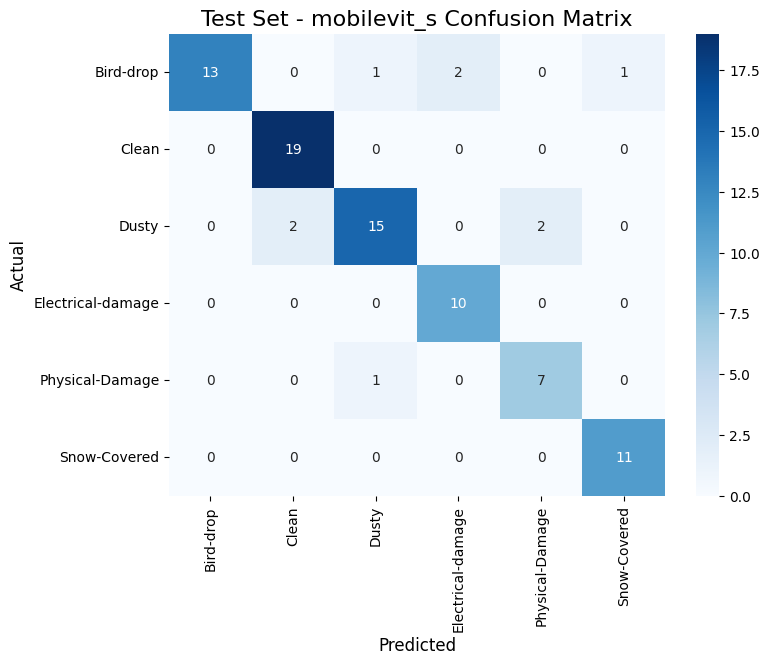

Matthews Corrcoef (MCC): 0.8717
Cohen's Kappa: 0.8694
Mean PPV (Precision): 0.8858
Mean NPV: 0.9784


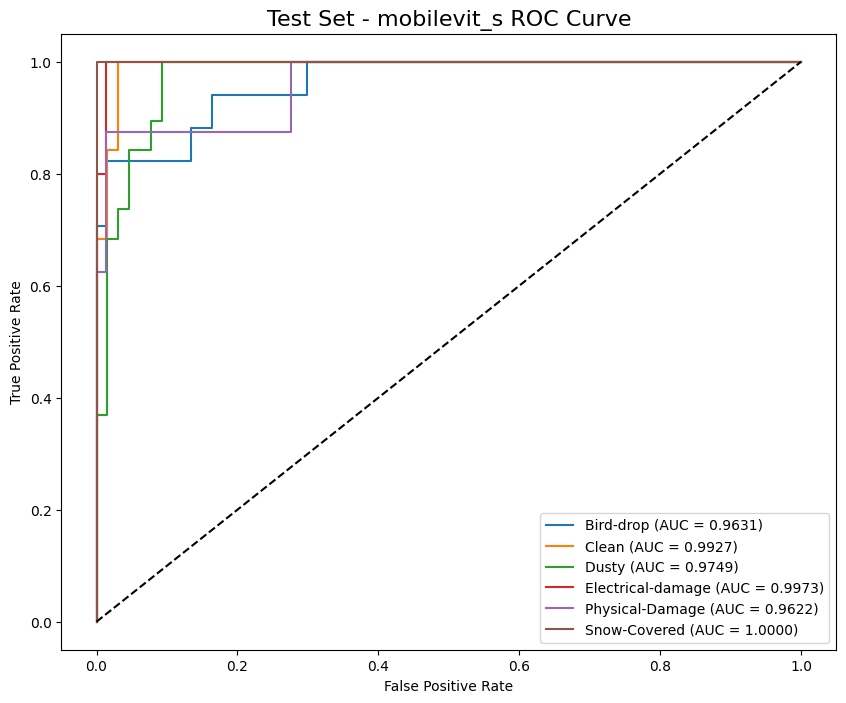

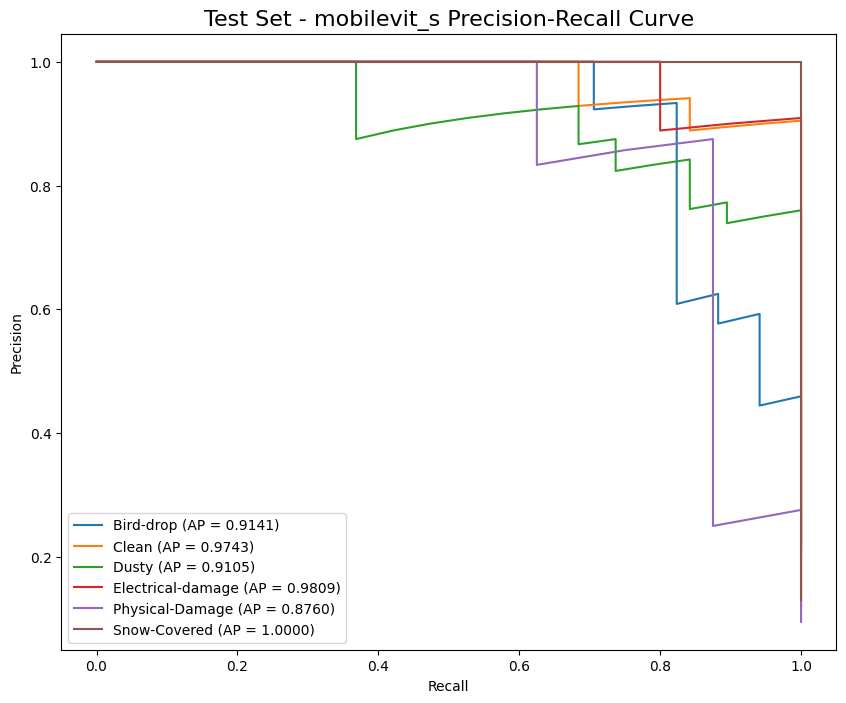



============================== FINAL MODEL COMPARISON ==============================
                       Model  Test Accuracy  Training Time (s)  Inference Time (s)  GPU Memory (MB)
                    vgg19_bn         0.9048           393.1349              0.4916       11180.9390
                    resnet50         0.8810           224.6391              0.3456        2982.6709
             efficientnet_b0         0.8929           208.3806              0.3123        2786.9453
                inception_v3         0.8929           189.2038              0.3806        2192.0000
swin_tiny_patch4_window7_224         0.8929           418.1559              0.4428        3729.5410
        vit_tiny_patch16_224         0.9286            89.3064              0.2921        1104.8545
                  levit_128s         0.9524           197.1626              0.2884         691.8174
       deit_tiny_patch16_224         0.9048            89.2170              0.2861        1104.8545
             

In [52]:

if __name__ == "__main__":
    if 'train_dataset' in locals():
        results = []
        for model_name in all_models_to_train:
            try:
                # Clear CUDA cache before training each model
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()
                
                result = train_and_evaluate_model(
                    model_name,
                    num_classes=NUM_CLASSES,
                    train_loader=train_loader,
                    val_loader=val_loader,
                    test_loader=test_loader,
                    device=DEVICE
                )
                if result:
                    results.append(result)
            except Exception as e:
                print(f"\nERROR: Could not train model {model_name}. Reason: {e}\n")
        
        # --- Display Final Summary Table ---
        if results:
            summary_df = pd.DataFrame(results)
            # Set display options for better formatting
            pd.set_option('display.float_format', '{:.4f}'.format)
            print("\n\n" + "="*30 + " FINAL MODEL COMPARISON " + "="*30)
            print(summary_df.to_string(index=False))
            print("="*82)
    else:
        print("\nSkipping model training because data loading failed.")